<a href="https://colab.research.google.com/github/TechTinkerPradhan/Classification-NaiveBayes-vs.-SupportVectorMachines/blob/main/Perception3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!sudo apt-get update -y
!sudo apt-get install python3.10

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:6 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:11 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [1,920 kB]
Fetched 2,149 kB in 2s (1,247 kB/s)
Reading package lists... Done
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done

In [ ]:
import numpy as np
import cv2
import glob
from google.colab.patches import cv2_imshow

In [ ]:
!mkdir images

mkdir: cannot create directory ‘images’: File exists


In [ ]:
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the left_images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

# TODO Part A (1): load the list of images in images using glob or any other function.
images = glob.glob('images/left*.jpg')
print(images)

['images/left01.jpg', 'images/left12.jpg', 'images/left09.jpg', 'images/left14.jpg', 'images/left08.jpg', 'images/left02.jpg', 'images/left06.jpg', 'images/left04.jpg', 'images/left03.jpg', 'images/left15.jpg', 'images/left11.jpg', 'images/left13.jpg', 'images/left07.jpg', 'images/left05.jpg']


images/left01.jpg
images/left12.jpg


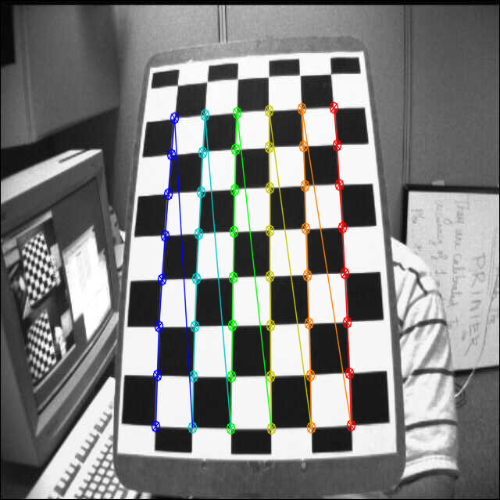

images/left09.jpg


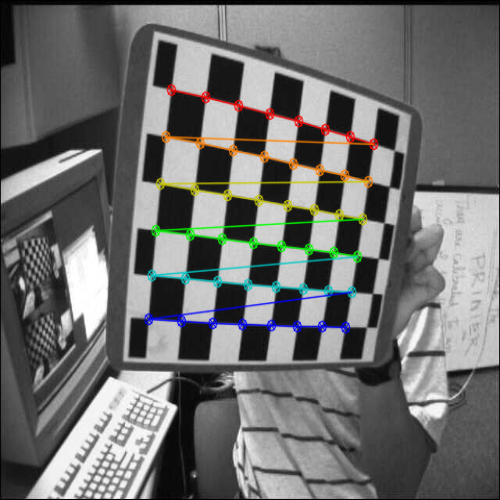

images/left14.jpg


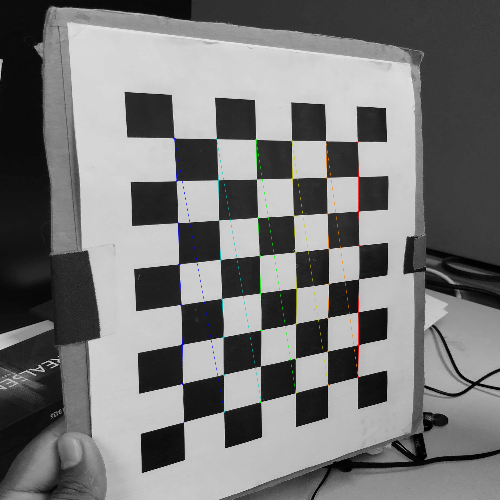

images/left08.jpg


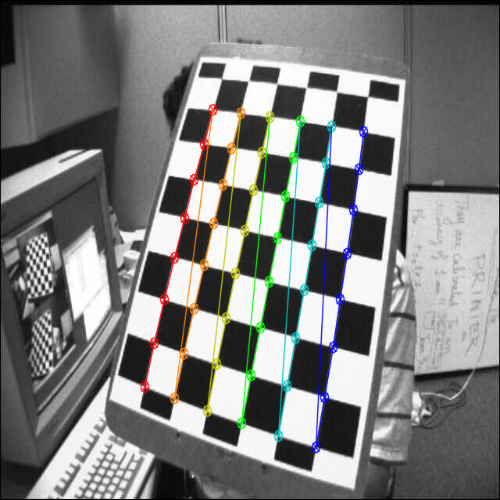

images/left02.jpg


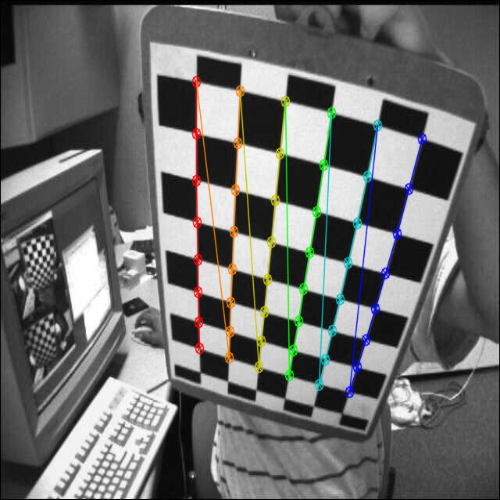

images/left06.jpg
images/left04.jpg


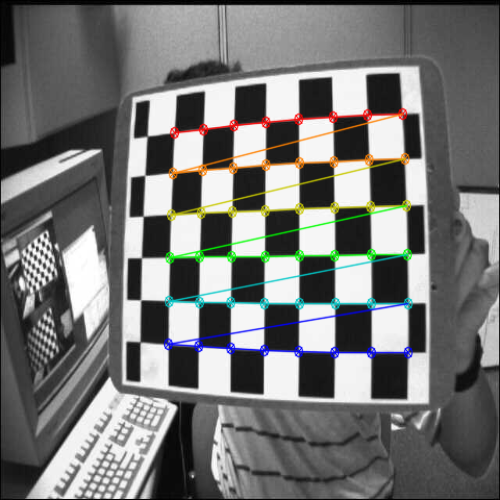

images/left03.jpg


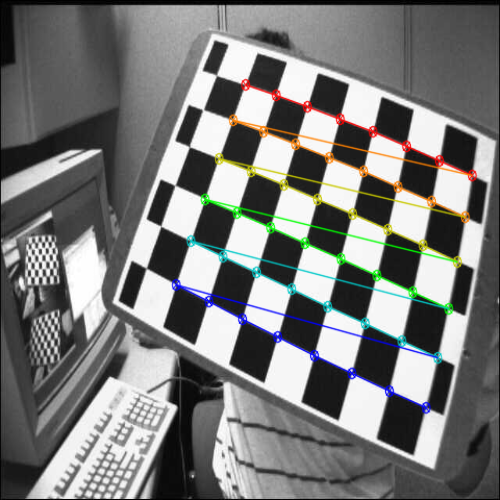

images/left15.jpg


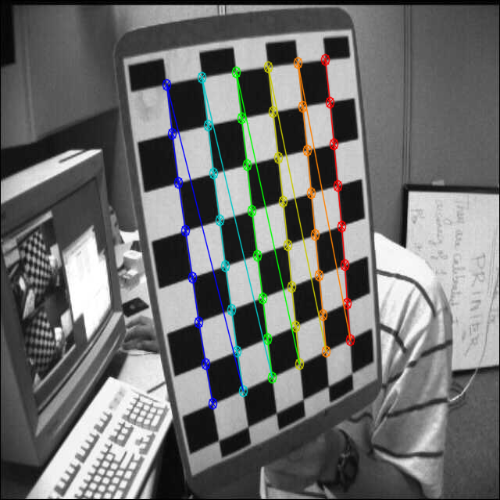

images/left11.jpg


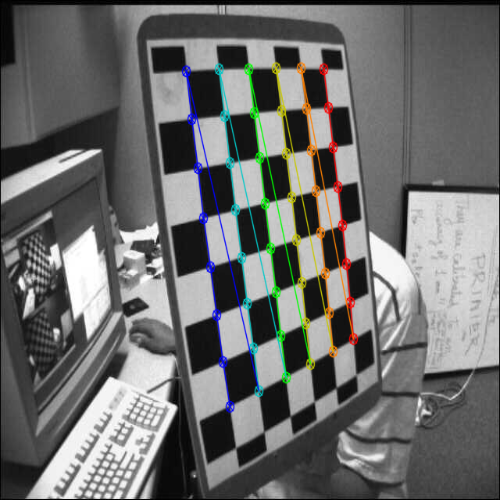

images/left13.jpg


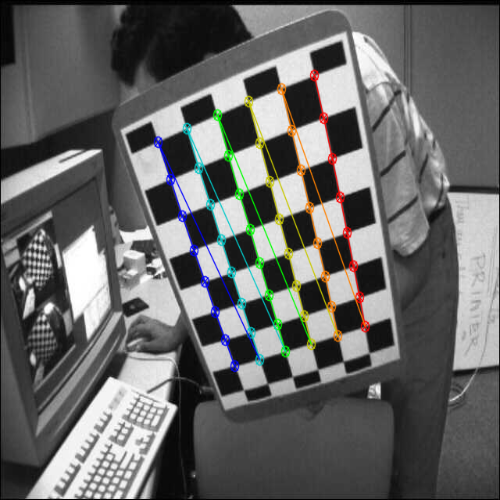

images/left07.jpg


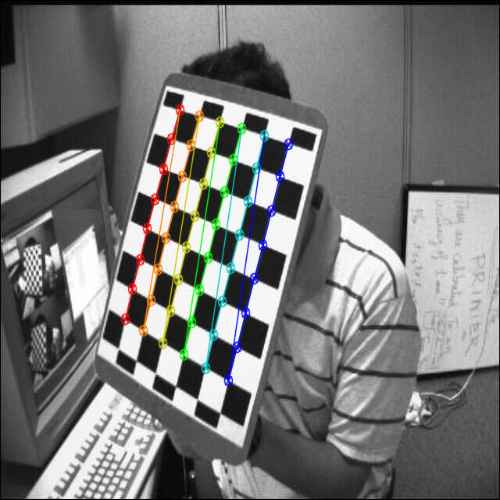

images/left05.jpg


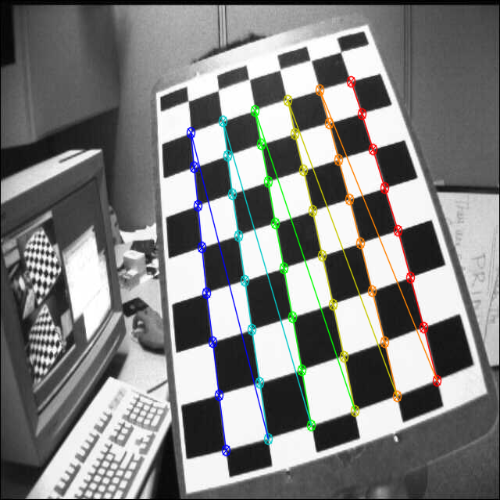

In [ ]:
for fname in images:
    # read image
    print(fname )
    # TODO Part A (1): read the image from "fname" using cv2 imread
    img = cv2.imread(fname)
    # TODO Part A (2): convert img to gray scale using cvtColor using cv2.COLOR_BGR2GRAY parameter
    gray =cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    # TODO Part A (3): find chess board corners using cv2 findChessboardCorners function, with "gray", grid size
    ret, corners = cv2.findChessboardCorners(gray,(8,6), None)

    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        # TODO Part A (6): find chess board corners using cv2 drawChessboardCorners function, with "img", grid size, corners2, and ret as parameters
        img =cv2.drawChessboardCorners(img, (8,6), corners2 ,ret)
        img = cv2.resize (img, (500, 500))
        # TODO Part A (4): display the image using cv2_imshow
        cv2_imshow(img)

In [ ]:
# TODO Part A (5): Compute camera matrix using cv2 calibrateCamera with objpoints, imgpoints, gray.shape[::-1] as parameters
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints,gray.shape[::-1], None, None)

In [ ]:
img = cv2.imread(images[9])
h,  w = img.shape[:2]

# the new camera matrix is being computed to remove the distortion
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

# undistort
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

# crop the image
x,y,w,h = roi
dst = dst[y:y+h, x:x+w]
cv2.imwrite('calibresult.png',dst)


True

In [ ]:
def draw(img, corners, imgpts):
    corner = tuple(corners[0].ravel())
    kk=tuple(imgpts[0].ravel().astype(int))
    print(tuple(imgpts[0].ravel().astype(int)))
    img = cv2.line(img, (int(corner[0]),int(corner[1])), tuple(imgpts[0].ravel().astype(int)), (255,0,0), 5)
    img = cv2.line(img, (int(corner[0]),int(corner[1])), tuple(imgpts[1].ravel().astype(int)), (0,255,0), 5)
    img = cv2.line(img, (int(corner[0]),int(corner[1])), tuple(imgpts[2].ravel().astype(int)), (0,0,255), 5)
    return img

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2)
axis = np.float32([[3,0,0], [0,3,0], [0,0,-3]]).reshape(-1,3)
print ('done')


done


Distance from Camera:  13.855111429999537 units
(435, 218)


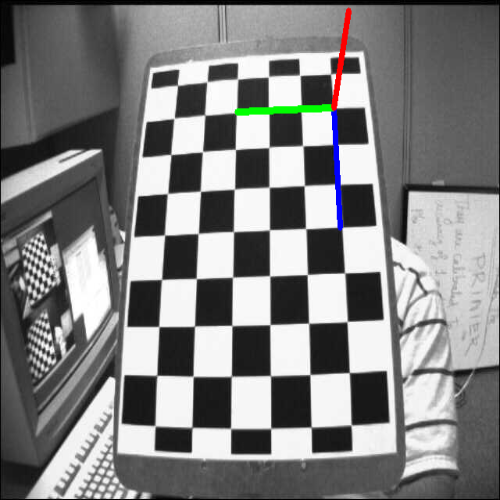

Distance from Camera:  12.791574759130752 units
(344, 108)


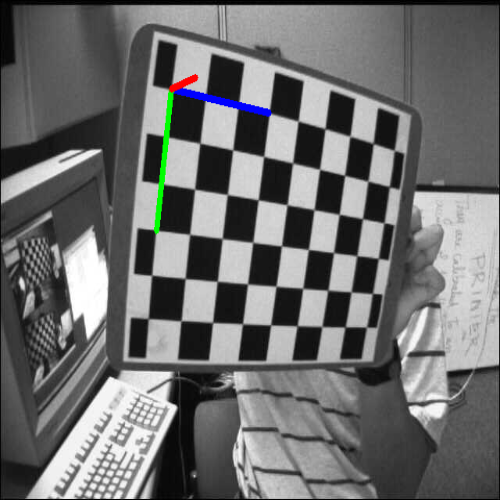

Distance from Camera:  8.141342780919084 units
(1769, 1491)


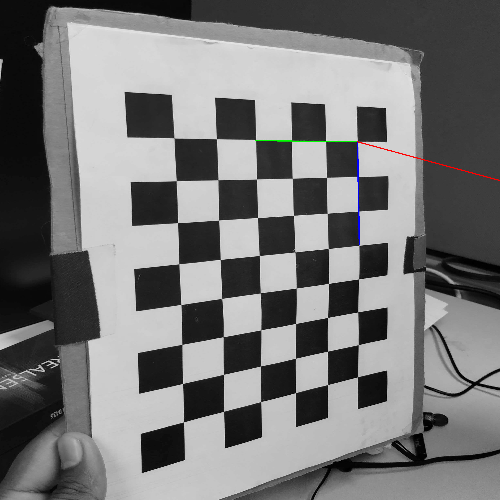

Distance from Camera:  12.999683709056187 units
(223, 247)


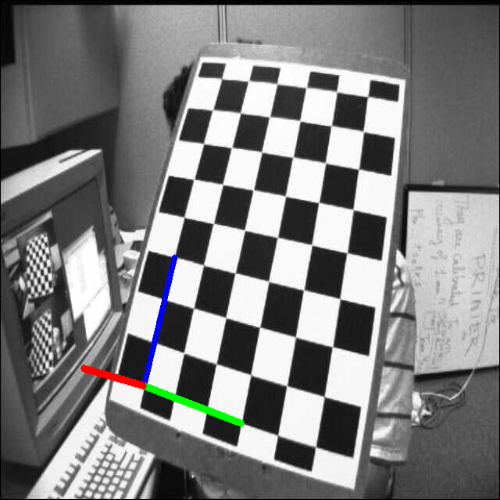

Distance from Camera:  14.539763861391028 units
(253, 248)


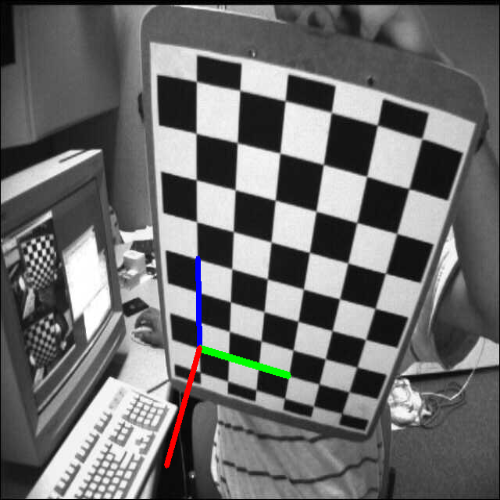

Distance from Camera:  14.251760884747304 units
(341, 117)


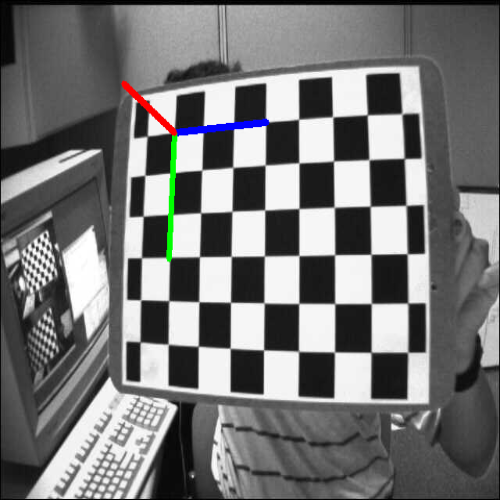

Distance from Camera:  13.69818591270492 units
(433, 114)


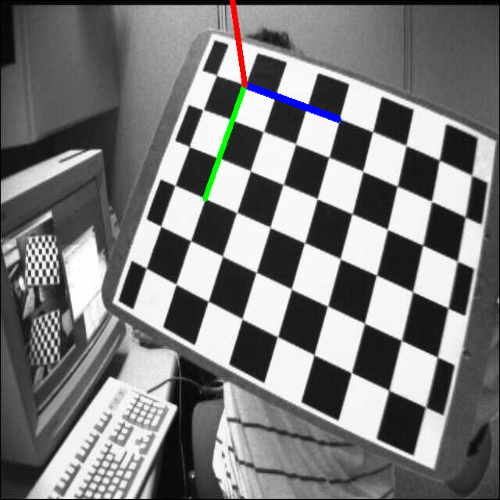

Distance from Camera:  14.176263250830594 units
(431, 177)


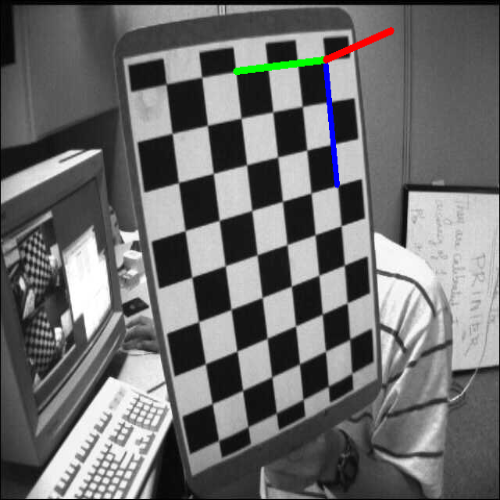

Distance from Camera:  15.153278871433116 units
(431, 178)


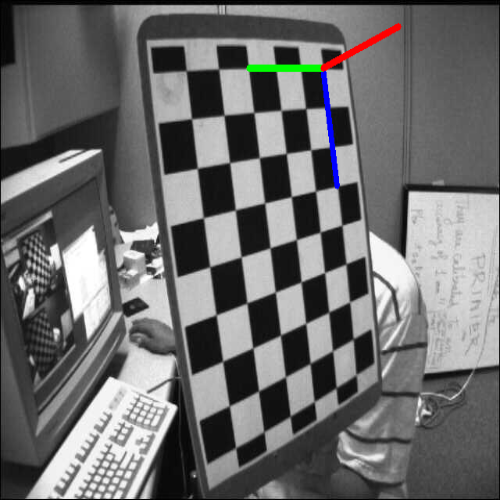

Distance from Camera:  12.831202378448852 units
(434, 188)


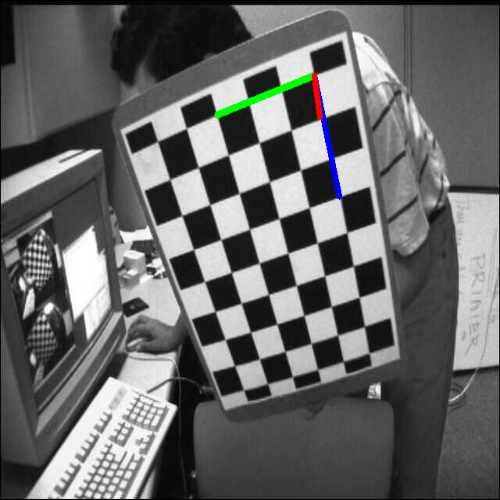

Distance from Camera:  19.146956359390405 units
(188, 219)


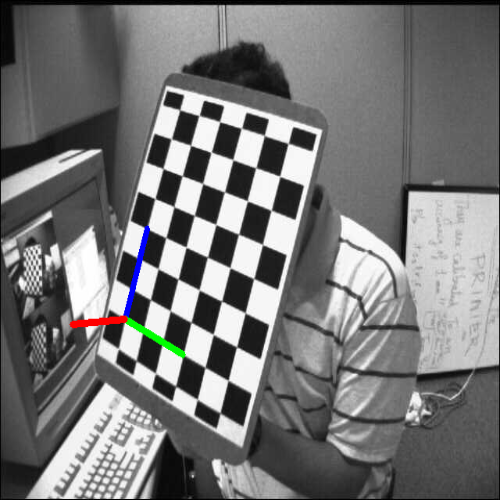

Distance from Camera:  13.760130074426511 units
(491, 181)


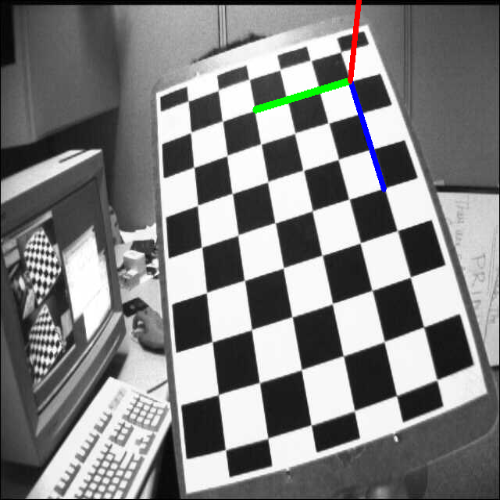

In [ ]:
for fname in images:
    # read image
    # TODO Part A (1): read the image from "fname" using cv2 imread
    img = cv2.imread(fname)
    # TODO Part A (2): convert img to gray scale using cvtColor using cv2.COLOR_BGR2GRAY parameter
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    # TODO Part A (3): find chess board corners using cv2 findChessboardCorners function, with "gray", grid size
    ret, corners = cv2.findChessboardCorners(gray,(8,6), None)

    if ret == True:
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)

        # Find the rotation and translation vectors.
        # TODO Part A (7): Find rotation and translation matrix by calling cv2.solvePnP using objp, corners2, mtx and dist as parameters
        ret,rvecs, tvecs = cv2.solvePnP(objp, corners2, mtx, dist)

        # TODO Part B: Print the distance from the camera using np linalg norm function with tvecs as input and mention the unit of measurement in pdf
        print("Distance from Camera: ", np.linalg.norm(tvecs),"units")
        # project 3D points to image plane
        imgpts, jac = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)
        img = draw(img,corners2,imgpts)
        img = cv2.resize (img, (500, 500))
        # TODO Part A (4): display the image using cv2_imshow
        cv2_imshow(img)

#PART 2:


1.   Distances are printed above
2.   Based on the  downloaded chess board from https://markhedleyjones.com/projects/calibration-checkerboard-collection
    

* For part A, given images have squares of 1 inch dimension.
* For part C: I downloaded the A4 - 25mm squares - 8x6 verticies, 9x7 squares chess board.
*   But while printing i didnt scale properly, so my chess squares are 1.8 cm in dimention which is aproximately 0.7 inches.
*   Given that eac hsquare in my chessbaord is 0.7 inches* 0.7 inches, the unit distance calculated by camera caliberation code will be 0.7 inches.
* This is because the cv2.solvePnP() fn calculates the translation vector in the same units as the object points objp. objp in our case is the corner of squares on chess board  and i have defined each square to be one unit whihc is 0.7 inches in my case( for part C, and 1 inch for part A).
* Hence, when we calculate the euclidean length to get the distance fro mcamera , this distance will also in units, where 1 unit =0.7 inches for part C and 1 inch for part A.





In [ ]:
!mkdir images2

# PART C:

In [ ]:
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the left_images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

# load the list of images in images using glob or any other function.
images = glob.glob('images2/*.jpg')
print(images)

['images2/6.jpg', 'images2/7.jpg', 'images2/1.jpg', 'images2/13.jpg', 'images2/9.jpg', 'images2/15.jpg', 'images2/12.jpg', 'images2/14.jpg', 'images2/4.jpg', 'images2/5.jpg', 'images2/2.jpg', 'images2/10.jpg', 'images2/11.jpg', 'images2/8.jpg', 'images2/3.jpg']


images2/6.jpg


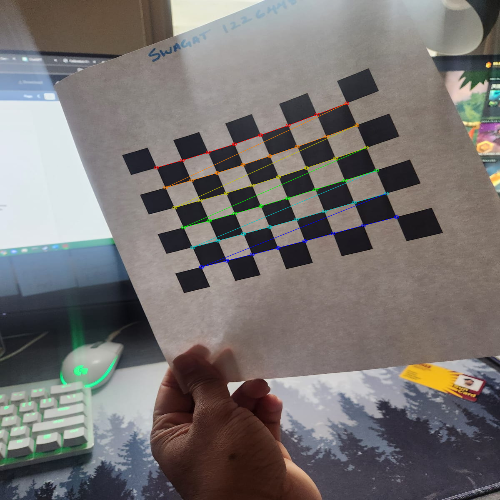

images2/7.jpg


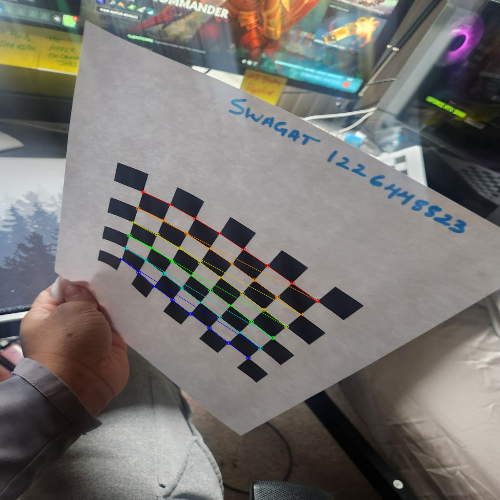

images2/1.jpg


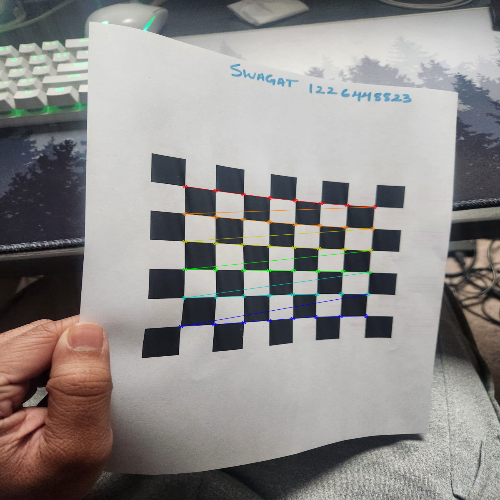

images2/13.jpg


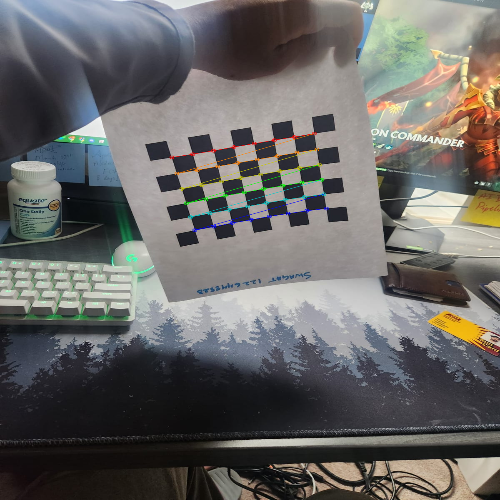

images2/9.jpg


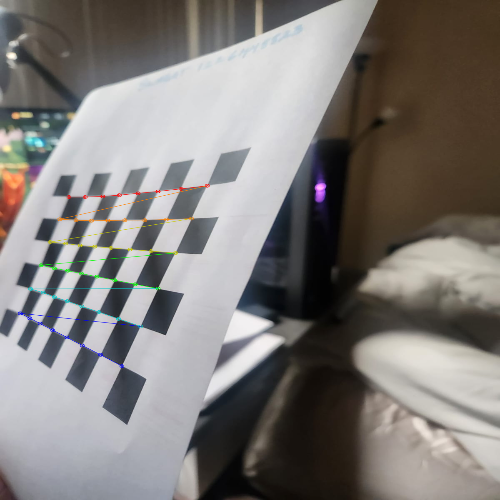

images2/15.jpg


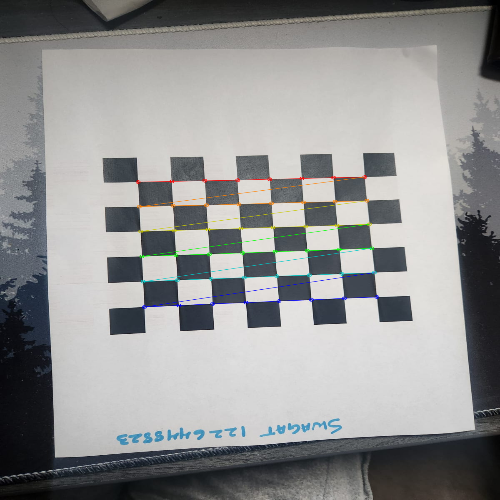

images2/12.jpg


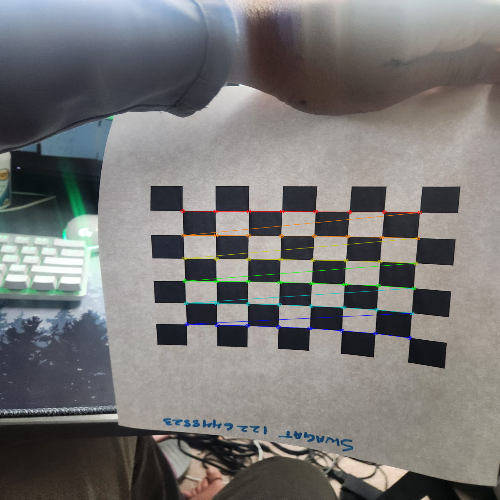

images2/14.jpg


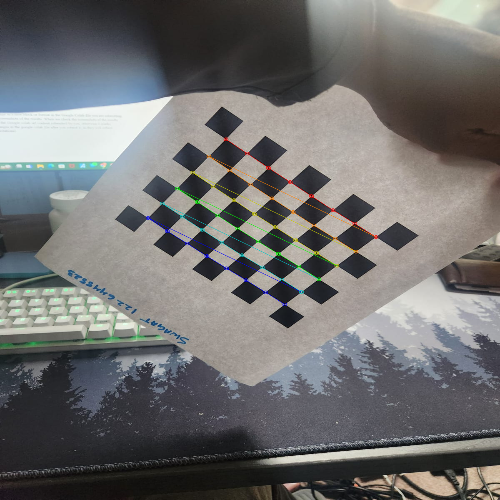

images2/4.jpg


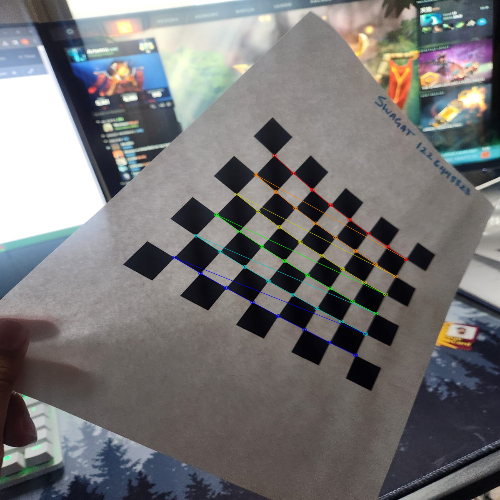

images2/5.jpg


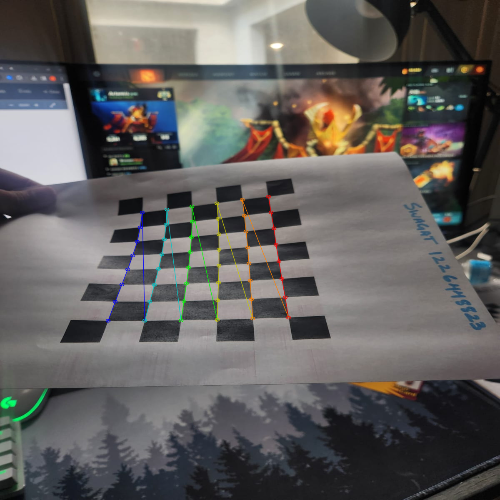

images2/2.jpg


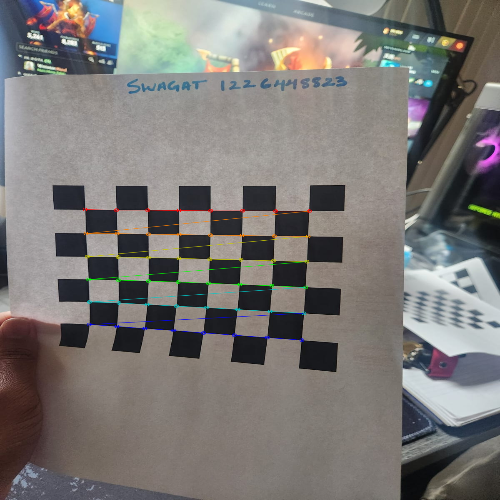

images2/10.jpg


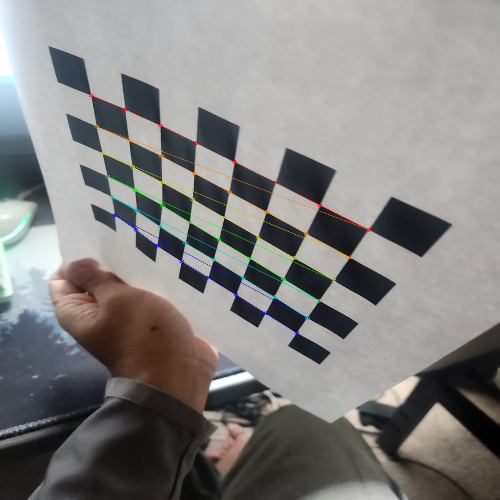

images2/11.jpg


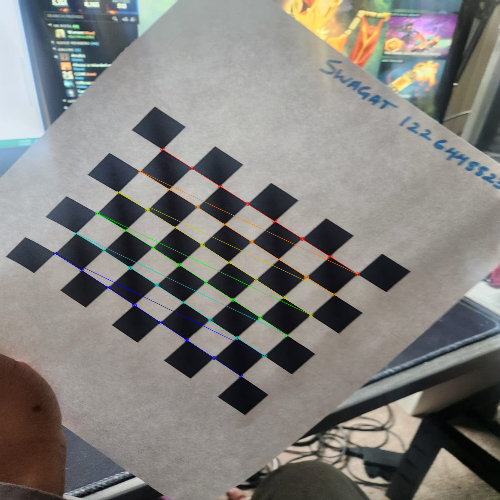

images2/8.jpg


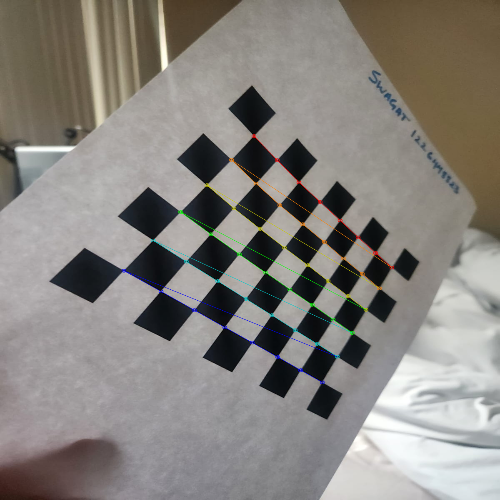

images2/3.jpg


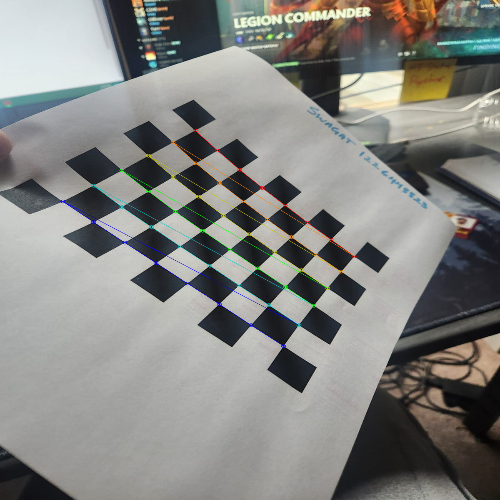

In [ ]:
for fname in images:
    # read image
    print(fname )
    img = cv2.imread(fname)
    # convert img to gray scale using cvtColor using cv2.COLOR_BGR2GRAY parameter
    gray =cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    #  find chess board corners using cv2 findChessboardCorners function, with "gray", grid size
    ret, corners = cv2.findChessboardCorners(gray,(8,6), None)

    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        # find chess board corners using cv2 drawChessboardCorners function, with "img", grid size, corners2, and ret as parameters
        img =cv2.drawChessboardCorners(img, (8,6), corners2 ,ret)
        img = cv2.resize (img, (500, 500))
        # display the image using cv2_imshow
        cv2_imshow(img)

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints,gray.shape[::-1], None, None)

In [ ]:
img = cv2.imread(images[9])
h,  w = img.shape[:2]

# the new camera matrix is being computed to remove the distortion
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

# undistort
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

# crop the image
x,y,w,h = roi
dst = dst[y:y+h, x:x+w]
cv2.imwrite('calibresult.png',dst)

True

In [ ]:
def draw(img, corners, imgpts):
    corner = tuple(corners[0].ravel())
    kk=tuple(imgpts[0].ravel().astype(int))
    print(tuple(imgpts[0].ravel().astype(int)))
    img = cv2.line(img, (int(corner[0]),int(corner[1])), tuple(imgpts[0].ravel().astype(int)), (255,0,0), 5)
    img = cv2.line(img, (int(corner[0]),int(corner[1])), tuple(imgpts[1].ravel().astype(int)), (0,255,0), 5)
    img = cv2.line(img, (int(corner[0]),int(corner[1])), tuple(imgpts[2].ravel().astype(int)), (0,0,255), 5)
    return img

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2)
axis = np.float32([[3,0,0], [0,3,0], [0,0,-3]]).reshape(-1,3)
print ('done')

done


Distance from Camera:  18.446268620767 units
(558, 458)


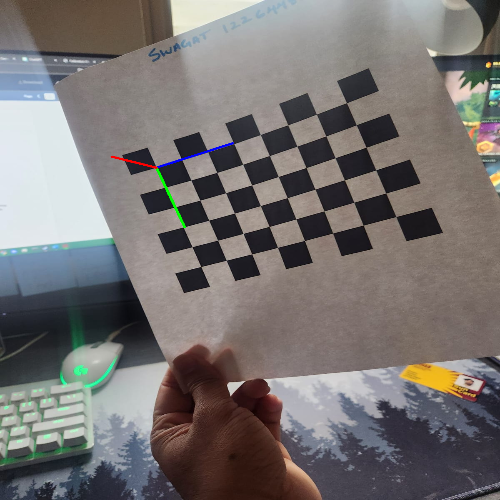

Distance from Camera:  15.875377433274402 units
(523, 749)


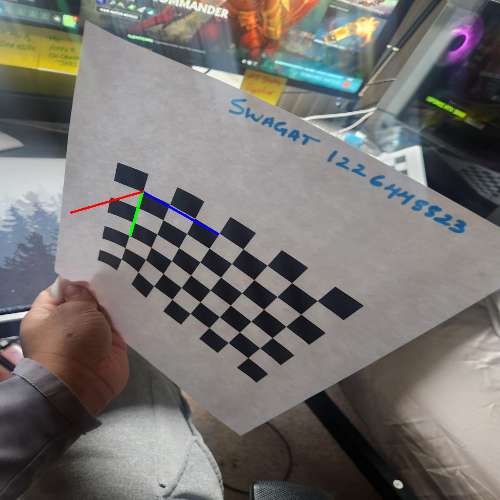

Distance from Camera:  13.540067619429868 units
(655, 631)


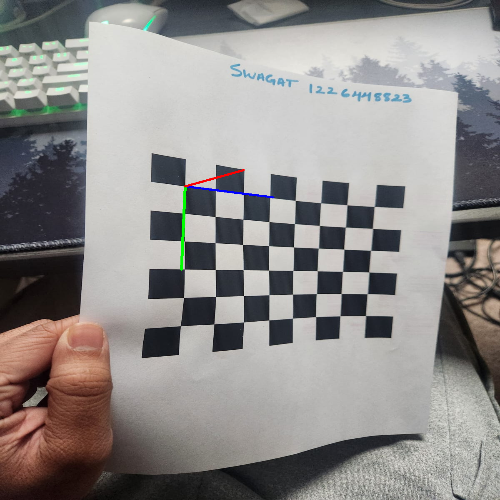

Distance from Camera:  24.236303315574947 units
(559, 470)


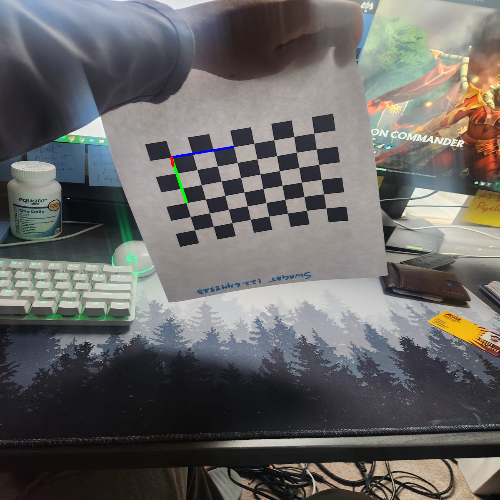

Distance from Camera:  16.464394216663973 units
(284, 620)


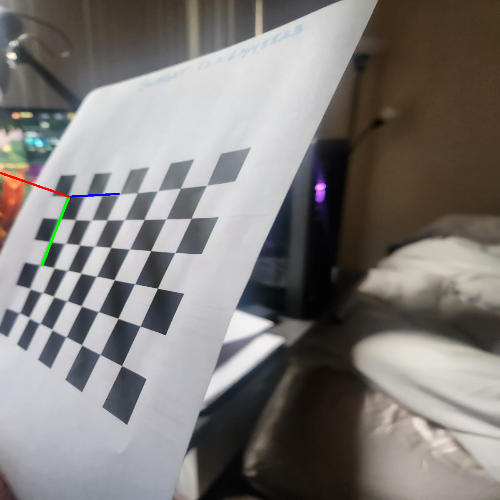

Distance from Camera:  15.163584987999654 units
(568, 576)


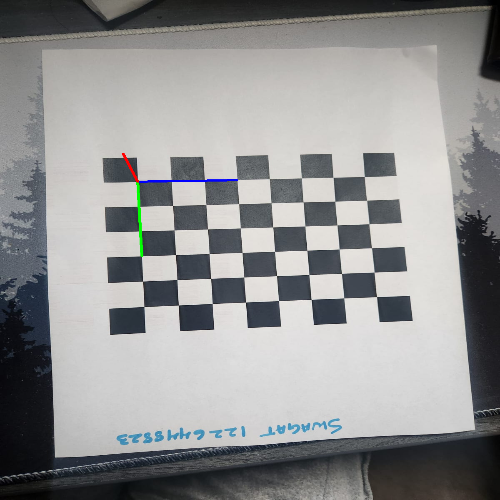

Distance from Camera:  15.253351847669737 units
(674, 676)


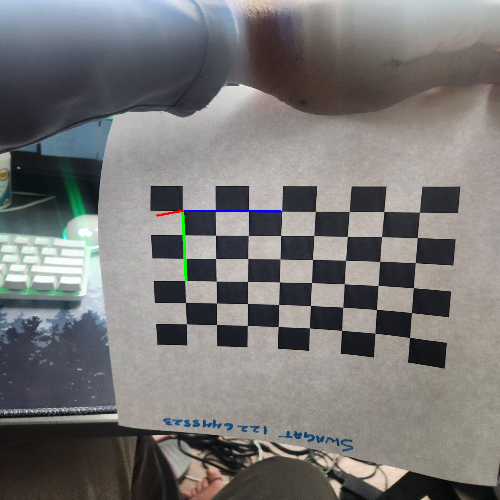

Distance from Camera:  17.776411016325365 units
(696, 581)


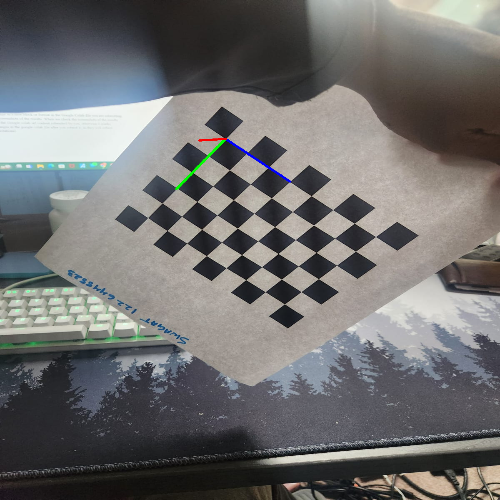

Distance from Camera:  15.156192016636892 units
(794, 654)


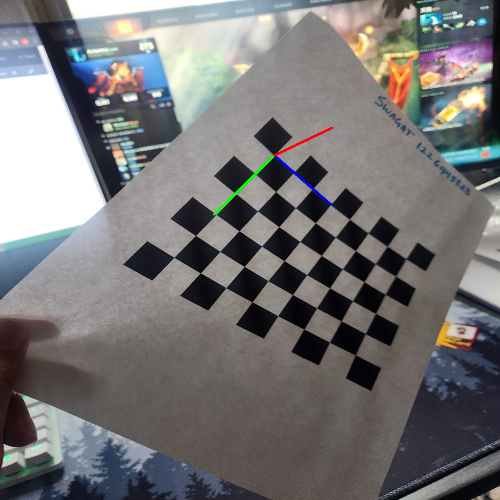

Distance from Camera:  18.74380435918459 units
(662, 779)


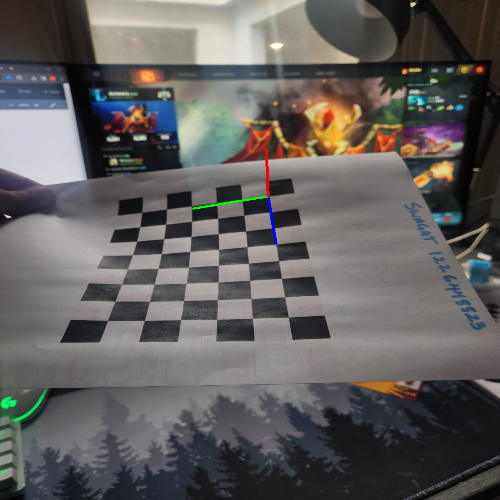

Distance from Camera:  16.3976486683173 units
(428, 672)


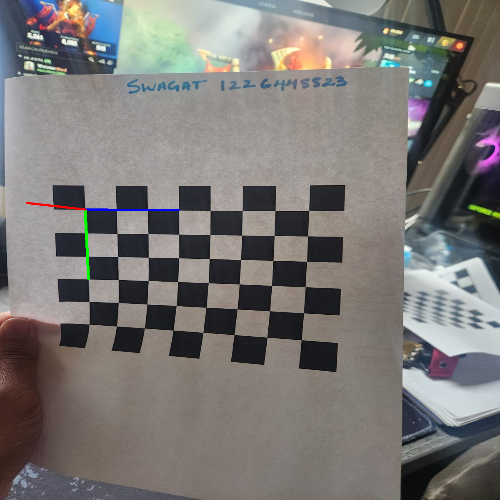

Distance from Camera:  11.827800866727538 units
(471, 456)


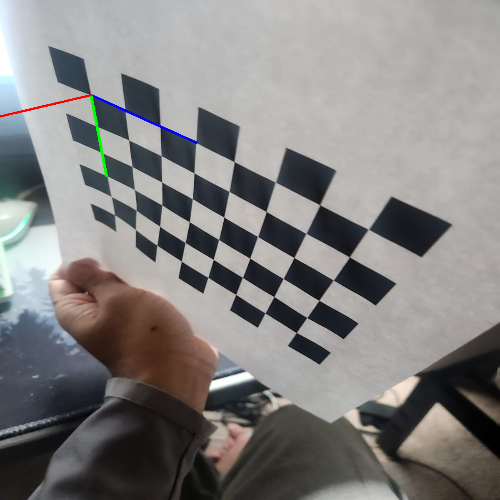

Distance from Camera:  14.105278657557415 units
(593, 651)


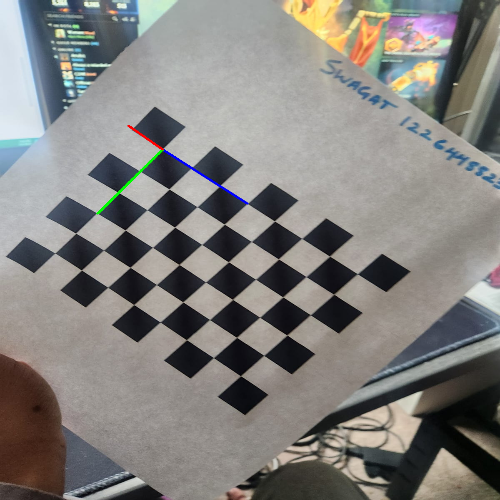

Distance from Camera:  11.659324360601794 units
(769, 644)


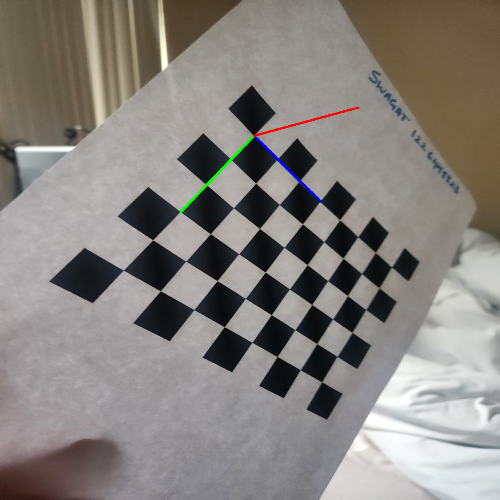

Distance from Camera:  15.350427591546598 units
(627, 600)


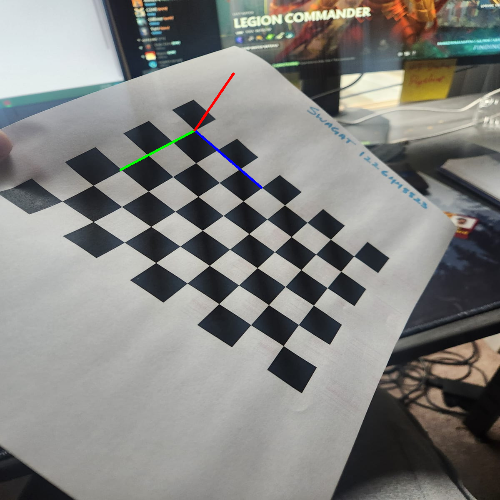

In [ ]:
for fname in images:
    # read image
    img = cv2.imread(fname)
    # convert img to gray scale using cvtColor using cv2.COLOR_BGR2GRAY parameter
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    # find chess board corners using cv2 findChessboardCorners function, with "gray", grid size
    ret, corners = cv2.findChessboardCorners(gray,(8,6), None)

    if ret == True:
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)

        # Find the rotation and translation vectors.
        # Find rotation and translation matrix by calling cv2.solvePnP using objp, corners2, mtx and dist as parameters
        ret,rvecs, tvecs = cv2.solvePnP(objp, corners2, mtx, dist)

        # Print the distance from the camera using np linalg norm function with tvecs as input and mention the unit of measurement in pdf
        print("Distance from Camera: ", np.linalg.norm(tvecs),"units")
        # project 3D points to image plane
        imgpts, jac = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)
        img = draw(img,corners2,imgpts)
        img = cv2.resize (img, (500, 500))
        cv2_imshow(img)